# *Zee Recommender Systems*

## 1. Define Problem Statement and Formatting the Data

Create a Recommender System to show personalized movie recommendations based on ratings given by a user and other users similar to them in order to improve user experience.

*Data Dictionary:*

RATINGS FILE DESCRIPTION
All ratings are contained in the file "ratings.dat" and are in the following format:

UserID::MovieID::Rating::Timestamp

- UserIDs range between 1 and 6040

- MovieIDs range between 1 and 3952

- Ratings are made on a 5-star scale (whole-star ratings only)

- Timestamp is represented in seconds

- Each user has at least 20 ratings

USERS FILE DESCRIPTION

User information is in the file "users.dat" and is in the following format:

UserID::Gender::Age::Occupation::Zip-code

All demographic information is provided voluntarily by the users and is not checked for accuracy.
Only users who have provided some demographic information are included in this data set.

- Gender is denoted by a "M" for male and "F" for female

- Age is chosen from the following ranges:

    1: "Under 18"
    18: "18-24"
    25: "25-34"
    35: "35-44"
    45: "45-49"
    50: "50-55"
    56: "56+"

- Occupation is chosen from the following choices:

    0: "other" or not specified

    1: "academic/educator"

    2: "artist"

    3: "clerical/admin"

    4: "college/grad student"

    5: "customer service"

    6: "doctor/health care"

    7: "executive/managerial"

    8: "farmer"

    9: "homemaker"

    10: "K-12 student"

    11: "lawyer"

    12: "programmer"

    13: "retired"

    14: "sales/marketing"

    15: "scientist"

    16: "self-employed"

    17: "technician/engineer"

    18: "tradesman/craftsman"

    19: "unemployed"

    20: "writer"

MOVIES FILE DESCRIPTION

Movie information is in the file "movies.dat" and is in the following format:

MovieID::Title::Genres

- Titles are identical to titles provided by the IMDB (including year of release)

- Genres are pipe-separated and are selected from the following genres:

    Action

    Adventure

    Animation

    Children's

    Comedy

    Crime

    Documentary

    Drama

    Fantasy

    Film-Noir

    Horror

    Musical

    Mystery

    Romance

    Sci-Fi

    Thriller

    War

    Western


Concepts Tested:

- Recommender Engine

- Collaborative Filtering (Item-based & User-based Approach)

- Pearson Correlation

- Nearest Neighbors using Cosine Similarity

- Matrix Factorization

In [5]:
### Importing all the required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings, os
import regex as re
import pickle
import mlflow
import chardet
import holidays
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy.sparse import csr_matrix
from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
from cmfrec import CMF
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
warnings.filterwarnings('ignore')

In [6]:
pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:.2f}'.format
sns.set_style('white')

### Movies

In [8]:
movies = pd.read_fwf('zee-movies.dat', encoding='ISO-8859-1')

In [9]:
movies.head()

,Movie ID::Title::Genres,Unnamed: 1,Unnamed: 2
0,1::Toy Story (1995)::Animation|Children's|Comedy,NaN,NaN
1,2::Jumanji (1995)::Adventure|Children's|Fantasy,NaN,NaN
2,3::Grumpier Old Men (1995)::Comedy|Romance,NaN,NaN
3,4::Waiting to Exhale (1995)::Comedy|Drama,NaN,NaN
4,5::Father of the Bride Part II (1995)::Comedy,NaN,NaN


In [10]:
print(f"shape of movies data is : {movies.shape}")

shape of movies data is : (3883, 3)


In [11]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3883 entries, 0 to 3882
Data columns (total 3 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Movie ID::Title::Genres  3883 non-null   object
 1   Unnamed: 1               100 non-null    object
 2   Unnamed: 2               51 non-null     object
dtypes: object(3)
memory usage: 91.1+ KB


In [12]:
movies.describe()

,Movie ID::Title::Genres,Unnamed: 1,Unnamed: 2
count,3883,100,51
unique,3883,73,45
top,1::Toy Story (1995)::Animation|Children's|Comedy,y,ma
freq,1,4,3


In [13]:
movies.describe(include='object')

,Movie ID::Title::Genres,Unnamed: 1,Unnamed: 2
count,3883,100,51
unique,3883,73,45
top,1::Toy Story (1995)::Animation|Children's|Comedy,y,ma
freq,1,4,3


In [14]:
movies.isnull().sum()

Movie ID::Title::Genres       0
Unnamed: 1                 3783
Unnamed: 2                 3832
dtype: int64

In [15]:
movies.drop(columns=['Unnamed: 1', 'Unnamed: 2'], axis=1, inplace=True)

delimiter = '::'
movies = movies['Movie ID::Title::Genres'].str.split(delimiter, expand=True)
movies.columns = ['Movie ID', 'Title', 'Genres']

movies.rename(columns={'Movie ID':'MovieID'}, inplace=True)
movies1=movies.copy()
movies.head()

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


### Ratings

In [17]:
ratings = pd.read_fwf('zee-ratings.dat', encoding='ISO-8859-1')

In [18]:
ratings.head()

,UserID::MovieID::Rating::Timestamp
0,1::1193::5::978300760
1,1::661::3::978302109
2,1::914::3::978301968
3,1::3408::4::978300275
4,1::2355::5::978824291


In [19]:
print(f"Shape of ratings data is :{ratings.shape}")

Shape of ratings data is :(1000209, 1)


In [20]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000209 entries, 0 to 1000208
Data columns (total 1 columns):
 #   Column                              Non-Null Count    Dtype 
---  ------                              --------------    ----- 
 0   UserID::MovieID::Rating::Timestamp  1000209 non-null  object
dtypes: object(1)
memory usage: 7.6+ MB


In [21]:
ratings.describe()

,UserID::MovieID::Rating::Timestamp
count,1000209
unique,1000209
top,1::1193::5::978300760
freq,1


In [22]:
ratings.isnull().sum()

UserID::MovieID::Rating::Timestamp    0
dtype: int64

In [23]:
ratings = ratings['UserID::MovieID::Rating::Timestamp'].str.split(delimiter, expand=True)
ratings.columns = ['UserID', 'MovieID', 'Rating', 'Timestamp']
ratings1=ratings.copy()
ratings.head()

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


### Users

In [25]:
users = pd.read_fwf('zee-users.dat', encoding='ISO-8859-1')

In [26]:
users.head()

,UserID::Gender::Age::Occupation::Zip-code
0,1::F::1::10::48067
1,2::M::56::16::70072
2,3::M::25::15::55117
3,4::M::45::7::02460
4,5::M::25::20::55455


In [27]:
print(f"Shape of users data is :{users.shape}")

Shape of users data is :(6040, 1)


In [28]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6040 entries, 0 to 6039
Data columns (total 1 columns):
 #   Column                                     Non-Null Count  Dtype 
---  ------                                     --------------  ----- 
 0   UserID::Gender::Age::Occupation::Zip-code  6040 non-null   object
dtypes: object(1)
memory usage: 47.3+ KB


In [29]:
users.describe()

,UserID::Gender::Age::Occupation::Zip-code
count,6040
unique,6040
top,1::F::1::10::48067
freq,1


In [30]:
users.describe(include='object')

,UserID::Gender::Age::Occupation::Zip-code
count,6040
unique,6040
top,1::F::1::10::48067
freq,1


In [31]:
users.isnull().sum()

UserID::Gender::Age::Occupation::Zip-code    0
dtype: int64

In [32]:
users = users['UserID::Gender::Age::Occupation::Zip-code'].str.split(delimiter, expand=True)
users.columns = ['UserID', 'Gender', 'Age', 'Occupation', 'Zip-code']
users1=users.copy()
users

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455
...,...,...,...,...,...
6035,6036,F,25,15,32603
6036,6037,F,45,1,76006
6037,6038,F,56,1,14706
6038,6039,F,45,0,01060


### *Insights:*
- we have delete Unnamed columns and use split limiter for create new  columns

In [33]:
users.replace({'Age':{'1':  "Under 18",
                      '18':  "18-24",
                      '25':  "25-34",
                      '35':  "35-44",
                      '45':  "45-49",
                      '50':  "50-55",
                      '56':  "56 Above"}}, inplace=True)

users.replace({'Occupation':{'0': "other",
                             '1': "academic/educator",
                             '2': "artist",
                             '3': "clerical/admin",
                             '4': "college/grad student",
                             '5': "customer service",
                             '6': "doctor/health care",
                             '7': "executive/managerial",
                             '8': "farmer",
                             '9': "homemaker",
                             '10': "k-12 student",
                             '11': "lawyer",
                             '12': "programmer",
                             '13': "retired",
                             '14': "sales/marketing",
                             '15': "scientist",
                             '16': "self-employed",
                             '17': "technician/engineer",
                             '18': "tradesman/craftsman",
                             '19': "unemployed",
                             '20': "writer"}}, inplace=True)

users.replace({'Gender':{'M': 'Male',
    'F': 'Female'}}, inplace=True)

In [34]:
# Dictionary of ZIP Code Ranges for US States
zip_code_ranges = {
    (35000, 36999): ("Alabama", "AL"),
    (99500, 99999): ("Alaska", "AK"),
    (85000, 86999): ("Arizona", "AZ"),
    (71600, 72999): ("Arkansas", "AR"),
    (90000, 96199): ("California", "CA"),
    (80000, 81999): ("Colorado", "CO"),
    (6000, 6999): ("Connecticut", "CT"),
    (19700, 19999): ("Delaware", "DE"),
    (32000, 34999): ("Florida", "FL"),
    (30000, 31999): ("Georgia", "GA"),
    (96700, 96999): ("Hawaii", "HI"),
    (83200, 83999): ("Idaho", "ID"),
    (60000, 62999): ("Illinois", "IL"),
    (46000, 47999): ("Indiana", "IN"),
    (50000, 52999): ("Iowa", "IA"),
    (66000, 67999): ("Kansas", "KS"),
    (40000, 42999): ("Kentucky", "KY"),
    (70000, 71599): ("Louisiana", "LA"),
    (3900, 4999): ("Maine", "ME"),
    (20600, 21999): ("Maryland", "MD"),
    (1000, 2799): ("Massachusetts", "MA"),
    (48000, 49999): ("Michigan", "MI"),
    (55000, 56999): ("Minnesota", "MN"),
    (38600, 39999): ("Mississippi", "MS"),
    (63000, 65999): ("Missouri", "MO"),
    (59000, 59999): ("Montana", "MT"),
    (27000, 28999): ("North Carolina", "NC"),
    (58000, 58999): ("North Dakota", "ND"),
    (68000, 69999): ("Nebraska", "NE"),
    (88900, 89999): ("Nevada", "NV"),
    (3000, 3899): ("New Hampshire", "NH"),
    (7000, 8999): ("New Jersey", "NJ"),
    (87000, 88499): ("New Mexico", "NM"),
    (10000, 14999): ("New York", "NY"),
    (43000, 45999): ("Ohio", "OH"),
    (73000, 74999): ("Oklahoma", "OK"),
    (97000, 97999): ("Oregon", "OR"),
    (15000, 19699): ("Pennsylvania", "PA"),
    (300, 999): ("Puerto Rico", "PR"),
    (2800, 2999): ("Rhode Island", "RI"),
    (29000, 29999): ("South Carolina", "SC"),
    (57000, 57999): ("South Dakota", "SD"),
    (37000, 38599): ("Tennessee", "TN"),
    (75000, 79999): ("Texas", "TX"),
    (88500, 88599): ("Texas", "TX"),
    (84000, 84999): ("Utah", "UT"),
    (5000, 5999): ("Vermont", "VT"),
    (22000, 24699): ("Virginia", "VA"),
    (20000, 20599): ("Washington DC", "DC"),
    (98000, 99499): ("Washington", "WA"),
    (24700, 26999): ("West Virginia", "WV"),
    (53000, 54999): ("Wisconsin", "WI"),
    (82000, 83199): ("Wyoming", "WY"),
}

        

In [35]:
def get_state_from_zip(zip_code):
    try:
        # Extract only the first 5 digits from ZIP code
        zip_code_int = int(str(zip_code)[:5])
        
        # Search for state in the ZIP code range
        for zip_range, (state, abbr) in zip_code_ranges.items():
            if zip_range[0] <= zip_code_int <= zip_range[1]:
                return state
        return "Unknown"
    except ValueError:
        return "Invalid"

In [36]:
# Apply function to DataFrame and create new columns
users["State_US"] = users["Zip-code"].apply(get_state_from_zip)

In [37]:
users.head()

,UserID,Gender,Age,Occupation,Zip-code,State_US
0,1,Female,Under 18,k-12 student,48067,Michigan
1,2,Male,56 Above,self-employed,70072,Louisiana
2,3,Male,25-34,scientist,55117,Minnesota
3,4,Male,45-49,executive/managerial,02460,Massachusetts
4,5,Male,25-34,writer,55455,Minnesota


## *Insights:*
- we converted demographic data State_US,Gender,Age and Occupation

In [38]:
# Using regular expressions to find a year stored between parentheses
movies['Year'] = movies["Title"].str.extract('(\(\d\d\d\d\))',expand=False)

# Removing the parentheses
movies['Year'] = movies["Year"].str.extract('(\d\d\d\d)',expand=False)

# Removing the years from the 'Title' column
movies['Title'] = movies['Title'].str.replace(r'\s\(\d{4}\)', '', regex=True)

# Applying the strip function to get rid of any ending whitespace characters that may have appeared
movies['Title'] = movies['Title'].apply(lambda x : x.strip())
movies.head()

,MovieID,Title,Genres,Year
0,1,Toy Story,Animation|Children's|Comedy,1995
1,2,Jumanji,Adventure|Children's|Fantasy,1995
2,3,Grumpier Old Men,Comedy|Romance,1995
3,4,Waiting to Exhale,Comedy|Drama,1995
4,5,Father of the Bride Part II,Comedy,1995


In [39]:
movies.dropna(inplace=True)
movies.Genres = movies.Genres.str.split('|')
movies['Genres'] = movies['Genres'].apply(lambda x: [i for i in x if i!='A' and i!='D' and i!= 'F' and i!='C' and i!='M' and i!= 'W' and i!= ' '])

for i  in movies['Genres']:
    for j in range(len(i)):
        if i[j] == 'Ro' or i[j] == 'Rom' or i[j] == 'Roman' or i[j] == 'R' or i[j] == 'Roma':
            i[j] = 'Romance'
        elif i[j] == 'Chil' or i[j] == 'Childre' or i[j] == 'Childr' or i[j] == "Children'" or i[j] =='Children' or i[j] =='Chi':
            i[j] = "Children's"
        elif i[j] == 'Fantas' or i[j] == 'Fant':
            i[j] = 'Fantasy'
        elif i[j] == 'Dr' or i[j] == 'Dram':
            i[j] = 'Drama'
        elif i[j] == 'Documenta'or i[j] == 'Docu' or i[j] == 'Document' or i[j] == 'Documen':
            i[j] = 'Documentary'
        elif i[j] == 'Wester'or i[j] == 'We':
            i[j] = 'Western'
        elif i[j] == 'Animati':
            i[j] = 'Animation'
        elif i[j] == 'Come'or i[j] == 'Comed' or i[j] == 'Com':
            i[j] = 'Comedy'
        elif i[j] == 'Sci-F'or i[j] == 'S' or i[j] == 'Sci-' or i[j] == 'Sci':
            i[j] = 'Sci-Fi'
        elif i[j] == 'Adv'or i[j] == 'Adventu' or i[j] == 'Adventur' or i[j] == 'Advent':
            i[j] = 'Adventure'
        elif i[j] == 'Horro'or i[j] == 'Horr':
            i[j] = 'Horror'
        elif i[j] == 'Th'or i[j] == 'Thri' or i[j] == 'Thrille':
            i[j] = 'Thriller'
        elif i[j] == 'Acti':
            i[j] = 'Action'
        elif i[j] == 'Wa':
            i[j] = 'War'
        elif i[j] == 'Music':
            i[j] = 'Musical'

In [40]:
movies.head()

,MovieID,Title,Genres,Year
0,1,Toy Story,"[Animation, Children's, Comedy]",1995
1,2,Jumanji,"[Adventure, Children's, Fantasy]",1995
2,3,Grumpier Old Men,"[Comedy, Romance]",1995
3,4,Waiting to Exhale,"[Comedy, Drama]",1995
4,5,Father of the Bride Part II,[Comedy],1995


## *Insights:*
- We extracted year from title
- Explode Gender column and complete Gender columns values

### Merge all above dataframes:

In [42]:
# Merging the dataframes movies and ratings on 'MovieID' column and save it to 'df1'
df1 = pd.merge(movies, ratings, how='inner', on='MovieID')
df1.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,978824268
1,1,Toy Story,"[Animation, Children's, Comedy]",1995,6,4,978237008
2,1,Toy Story,"[Animation, Children's, Comedy]",1995,8,4,978233496
3,1,Toy Story,"[Animation, Children's, Comedy]",1995,9,5,978225952
4,1,Toy Story,"[Animation, Children's, Comedy]",1995,10,5,978226474


In [43]:
# Merging the dataframes df1 and users_df on 'UserID' column and save it to 'data'
data = pd.merge(df1, users, how='inner', on='UserID')
data.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,State_US
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,978824268,Female,Under 18,k-12 student,48067,Michigan
1,1,Toy Story,"[Animation, Children's, Comedy]",1995,6,4,978237008,Female,50-55,homemaker,55117,Minnesota
2,1,Toy Story,"[Animation, Children's, Comedy]",1995,8,4,978233496,Male,25-34,programmer,11413,New York
3,1,Toy Story,"[Animation, Children's, Comedy]",1995,9,5,978225952,Male,25-34,technician/engineer,61614,Illinois
4,1,Toy Story,"[Animation, Children's, Comedy]",1995,10,5,978226474,Female,35-44,academic/educator,95370,California


In [44]:
# Getting the shape of the data
data.shape

(996144, 12)

In [45]:
# Checking the data types of the data
data.dtypes

MovieID       object
Title         object
Genres        object
Year          object
UserID        object
Rating        object
Timestamp     object
Gender        object
Age           object
Occupation    object
Zip-code      object
State_US      object
dtype: object

In [46]:
# Changing the datatype from object to date_time
data['Timestamp'] = pd.to_datetime(data['Timestamp'], unit='s')

# Changing the datatype from object to Integer
data['Year'] = data['Year'].astype('int32')

# Changing the datatype from object to Integer
data['Rating']=data['Rating'].astype('int32')

# Extract components from Timestamp
data['Month'] = data['Timestamp'].dt.month

data['Day'] = data['Timestamp'].dt.day

data['DayOfWeek'] = data['Timestamp'].dt.dayofweek  # Monday=0, Sunday=6

data['isWeekend'] = data['DayOfWeek'].isin([5, 6]).astype(int)

us_holidays = holidays.US()
data['isHoliday'] = data['Timestamp'].dt.date.apply(lambda x: int(x in us_holidays))

In [47]:
# Creating a new column 'ReleaseYear'
bins = [1909, 1919, 1929, 1939, 1949, 1959, 1969, 1979, 1989, 2000]
labels = ['10s', '20s', '30s', '40s', '50s', '60s', '70s', '80s', '90s']
data['ReleaseYear'] = pd.cut(data['Year'], bins=bins, labels=labels)

## *Insights:*
- we have to create Month, Day, day of week,isweekend and isholiday

In [48]:
data

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,State_US,Month,Day,DayOfWeek,isWeekend,isHoliday,ReleaseYear
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,2001-01-06 23:37:48,Female,Under 18,k-12 student,48067,Michigan,1,6,5,1,0,90s
1,1,Toy Story,"[Animation, Children's, Comedy]",1995,6,4,2000-12-31 04:30:08,Female,50-55,homemaker,55117,Minnesota,12,31,6,1,0,90s
2,1,Toy Story,"[Animation, Children's, Comedy]",1995,8,4,2000-12-31 03:31:36,Male,25-34,programmer,11413,New York,12,31,6,1,0,90s
3,1,Toy Story,"[Animation, Children's, Comedy]",1995,9,5,2000-12-31 01:25:52,Male,25-34,technician/engineer,61614,Illinois,12,31,6,1,0,90s
4,1,Toy Story,"[Animation, Children's, Comedy]",1995,10,5,2000-12-31 01:34:34,Female,35-44,academic/educator,95370,California,12,31,6,1,0,90s
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996139,3952,"Contender, The","[Drama, Thriller]",2000,5812,4,2001-06-09 07:34:59,Female,25-34,executive/managerial,92120,California,6,9,5,1,0,90s
996140,3952,"Contender, The","[Drama, Thriller]",2000,5831,3,2001-04-02 14:52:05,Male,25-34,academic/educator,92120,California,4,2,0,0,0,90s
996141,3952,"Contender, The","[Drama, Thriller]",2000,5837,4,2002-01-24 20:04:16,Male,25-34,executive/managerial,60607,Illinois,1,24,3,0,0,90s
996142,3952,"Contender, The","[Drama, Thriller]",2000,5927,1,2001-01-18 21:15:37,Male,35-44,sales/marketing,10003,New York,1,18,3,0,0,90s


## EXPLORATORY DATA ANALYSIS

### User Analysis

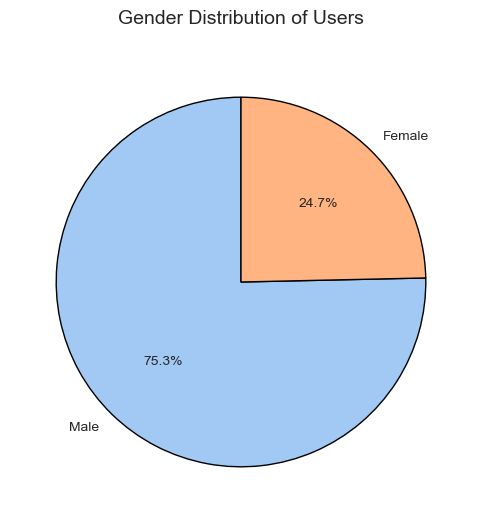

In [51]:
# Count of each gender
gender_counts = data['Gender'].value_counts()

# Plot Pie Chart using Matplotlib
plt.figure(figsize=(6, 6))
plt.pie(gender_counts.values, labels=gender_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'), wedgeprops={'edgecolor': 'black'})

# Add title and formatting
plt.title('Gender Distribution of Users', fontsize=14, pad=20)
plt.show()

## *Insights:*
-  Male percentage is **75%** and female percenatge is **25%**

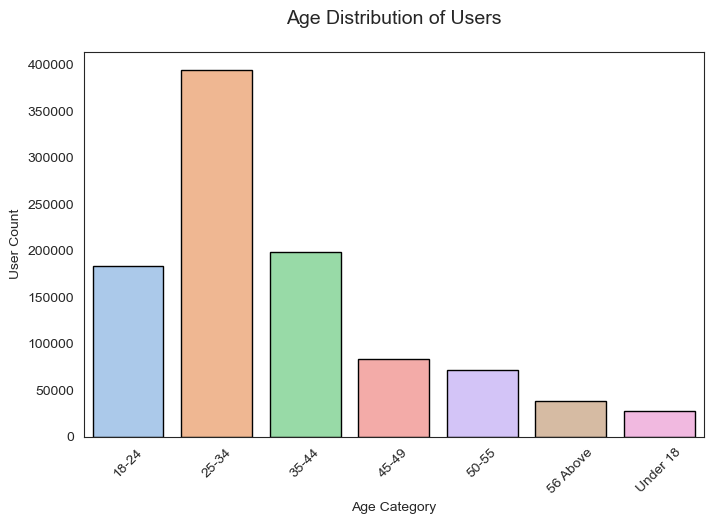

In [52]:
# Count of users in each age category
age_counts = data['Age'].value_counts().sort_index()

# Plot bar chart using Seaborn
plt.figure(figsize=(8, 5))
sns.barplot(x=age_counts.index, y=age_counts.values, palette='pastel', edgecolor='black')

# Add labels and title
plt.title('Age Distribution of Users', fontsize=14, pad=20)
plt.xlabel('Age Category')
plt.ylabel('User Count')
plt.xticks(rotation=45)
plt.show()

## *Insights:*
- Age group **25-34** are highest compared to other age group

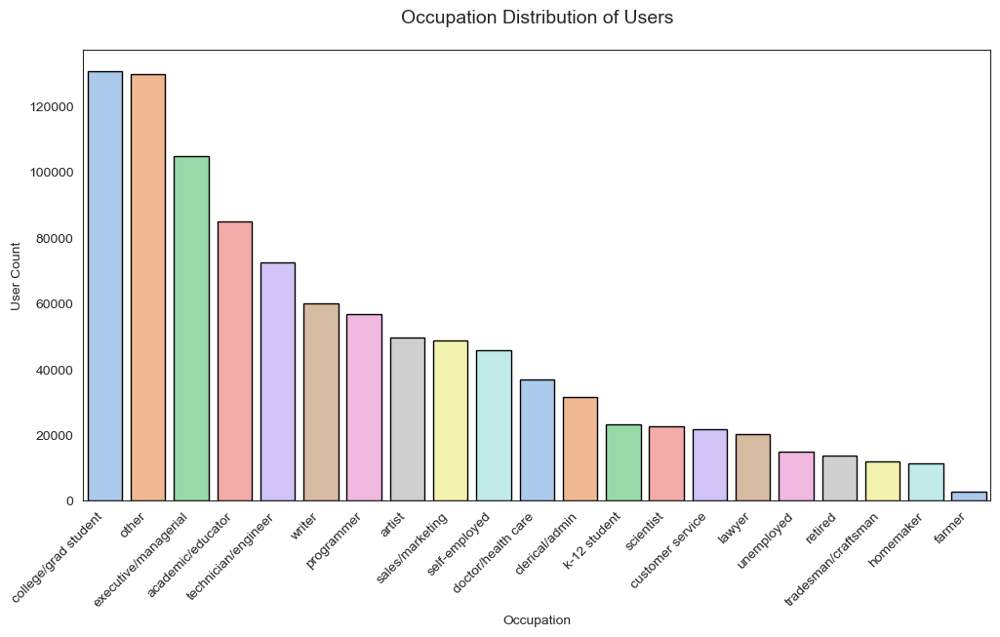

In [53]:
# Count of users in each occupation category
occupation_counts = data['Occupation'].value_counts().sort_values(ascending=False)

# Plot bar chart using Seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x=occupation_counts.index, y=occupation_counts.values, palette='pastel', edgecolor='black')

# Add labels and title
plt.title('Occupation Distribution of Users', fontsize=14, pad=20)
plt.xlabel('Occupation')
plt.ylabel('User Count')
plt.xticks(rotation=45, ha='right')
plt.show()

## *Insights:*
- **College/grad student** are highest occupation compared to other

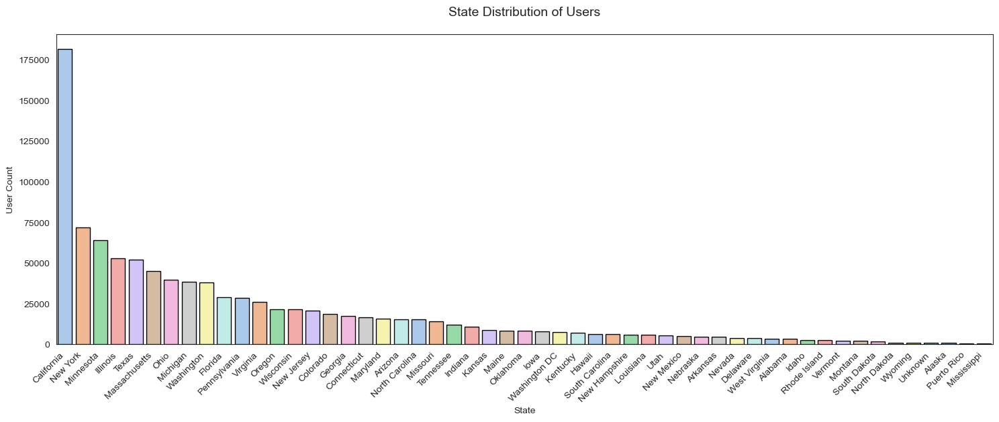

In [54]:
# Count of users in each State category
State_counts = data['State_US'].value_counts().sort_values(ascending=False)

# Plot bar chart using Seaborn
plt.figure(figsize=(18, 6))
sns.barplot(x=State_counts.index, y=State_counts.values, palette='pastel', edgecolor='black')

# Add labels and title
plt.title('State Distribution of Users', fontsize=14, pad=20)
plt.xlabel('State')
plt.ylabel('User Count')
plt.xticks(rotation=45, ha='right')
plt.show()

## *Insights:*
- **California** state are the highest user distribution

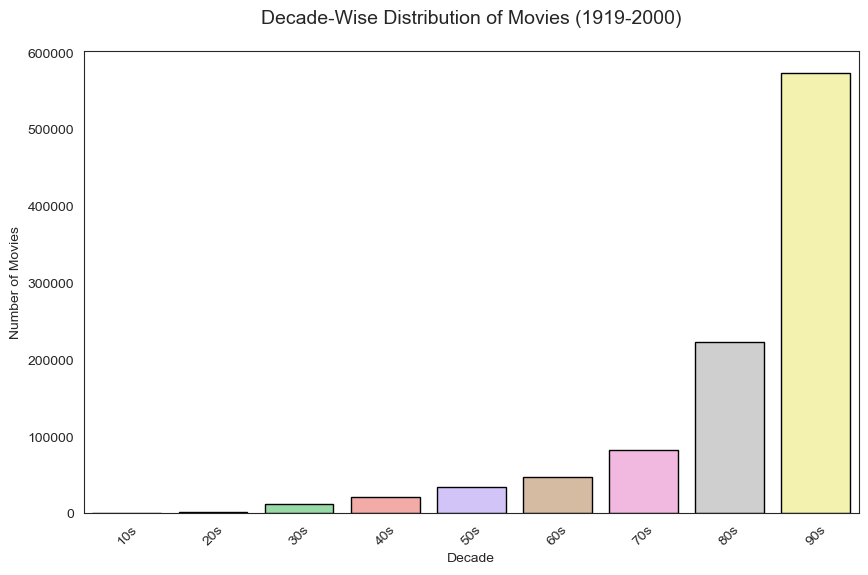

In [55]:
# Count the number of movies per decade
decade_counts = data['ReleaseYear'].value_counts().sort_index()

# Plot bar chart using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x=decade_counts.index, y=decade_counts.values, palette='pastel', edgecolor='black')

# Add labels and title
plt.title('Decade-Wise Distribution of Movies (1919-2000)', fontsize=14, pad=20)
plt.xlabel('Decade')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45)
plt.show()

## *Insights:*
- **90s** decade are the highest distribution of movies

In [56]:
print(f'Mean rating score is {data.Rating.mean()}')
print(f'Median rating score is {data.Rating.median()}')

Mean rating score is 3.57998542379415
Median rating score is 4.0


<Axes: xlabel='Rating'>

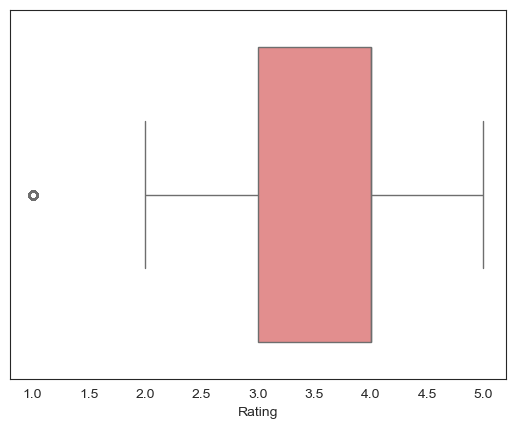

In [57]:
sns.boxplot(x='Rating', data=data, color='lightcoral')

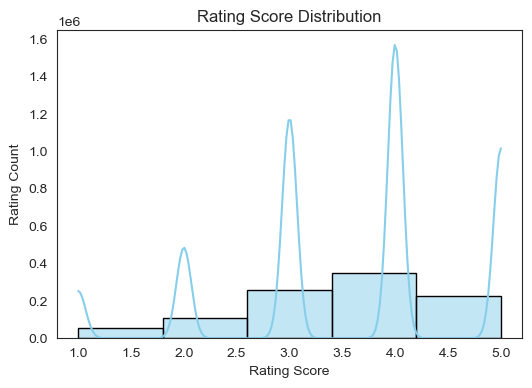

In [58]:
# Plot histogram for Rating distribution
plt.figure(figsize=(6, 4))
sns.histplot(data['Rating'], bins=5, kde=True, color='skyblue', edgecolor='black')
plt.title('Rating Score Distribution')
plt.xlabel('Rating Score')
plt.ylabel('Rating Count')
plt.show()

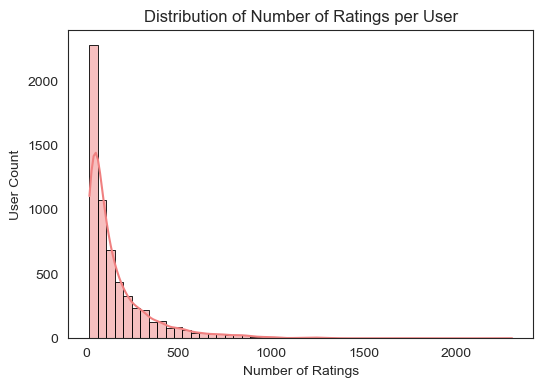

In [59]:
plt.figure(figsize=(6, 4))
sns.histplot(data['UserID'].value_counts(), bins=50, kde=True, color='lightcoral', edgecolor='black')
plt.title('Distribution of Number of Ratings per User')
plt.xlabel('Number of Ratings')
plt.ylabel('User Count')
plt.show()


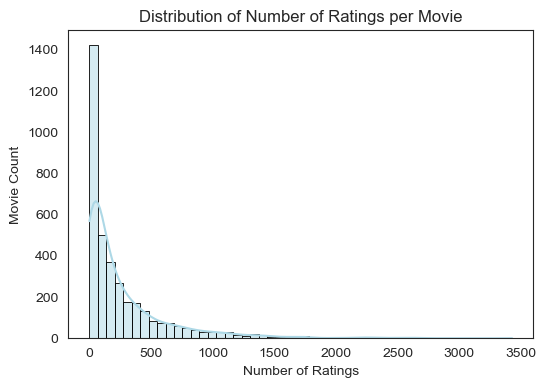

In [60]:
plt.figure(figsize=(6, 4))
sns.histplot(data['MovieID'].value_counts(), bins=50, kde=True, color='lightblue', edgecolor='black')
plt.title('Distribution of Number of Ratings per Movie')
plt.xlabel('Number of Ratings')
plt.ylabel('Movie Count')
plt.show()


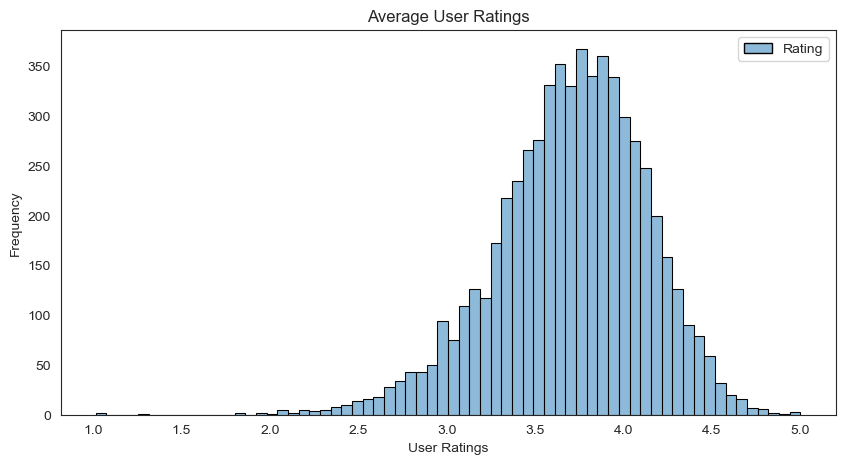

In [61]:
avg_user_ratings = data[['UserID','Rating']].groupby('UserID').mean()
fig = plt.figure(figsize = (10, 5))
sns.histplot(data=avg_user_ratings, color = 'blue', alpha = 0.5, edgecolor='black')
plt.xlabel('User Ratings')
plt.title('Average User Ratings')
plt.ylabel('Frequency')
plt.show()

## *Insights:*
- Rating 3 to 4 highest value count
- Rating range 3 to 4.5 has highest average user rationg

In [62]:
movies_rating_count = data.groupby('Title')['Rating'].count().reset_index(name = 'TotalRatingCount')
top10_movies=movies_rating_count.sort_values(by='TotalRatingCount',ascending=False).head(10)
top10_movies

,Title,TotalRatingCount
125,American Beauty,3428
3099,Star Wars: Episode IV - A New Hope,2991
3100,Star Wars: Episode V - The Empire Strikes Back,2990
3101,Star Wars: Episode VI - Return of the Jedi,2883
1761,Jurassic Park,2672
2843,Saving Private Ryan,2653
3238,Terminator 2: Judgment Day,2649
2075,"Matrix, The",2590
256,Back to the Future,2583
2936,"Silence of the Lambs, The",2578


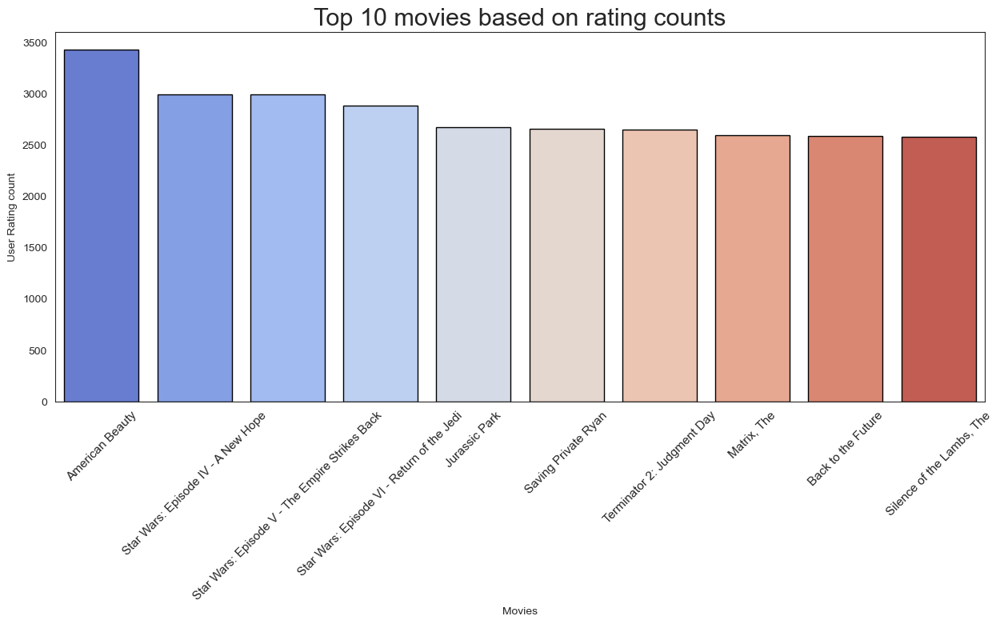

In [63]:
plt.figure(figsize=(15,6))
ax=sns.barplot(x="Title", y="TotalRatingCount", data=top10_movies,palette='coolwarm', edgecolor='black')
plt.xticks(rotation=45, fontsize=11)
plt.title('Top 10 movies based on rating counts',fontsize = 22)
plt.xlabel('Movies',fontsize = 10)
plt.ylabel('User Rating count', fontsize = 10)
plt.show()

## *Insights:*
- **American Beauty** are the top rating movie

In [64]:
# Create a DataFrame of genres
genres_df = pd.get_dummies(movies['Genres'].apply(pd.Series).stack()).groupby(level=0).sum()
genres_df.head()

,,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [65]:
# considering all the genre columns for the test
test = genres_df.sum(axis = 0)
test=test.iloc[1:]
print(test)

Action          501
Adventure       282
Animation       104
Children's      249
Comedy         1189
Crime           210
Documentary     124
Drama          1582
Fantasy          62
Film-Noir        44
Horror          340
Musical         113
Mystery         105
Romance         462
Sci-Fi          265
Thriller        488
War             139
Western          68
dtype: int64


In [66]:
print(type(pd.to_numeric(test)))
print(type(test.to_numpy().reshape(len(test),)[0]))
test2 = test.to_numpy().reshape(18,)

<class 'pandas.core.series.Series'>
<class 'numpy.int64'>


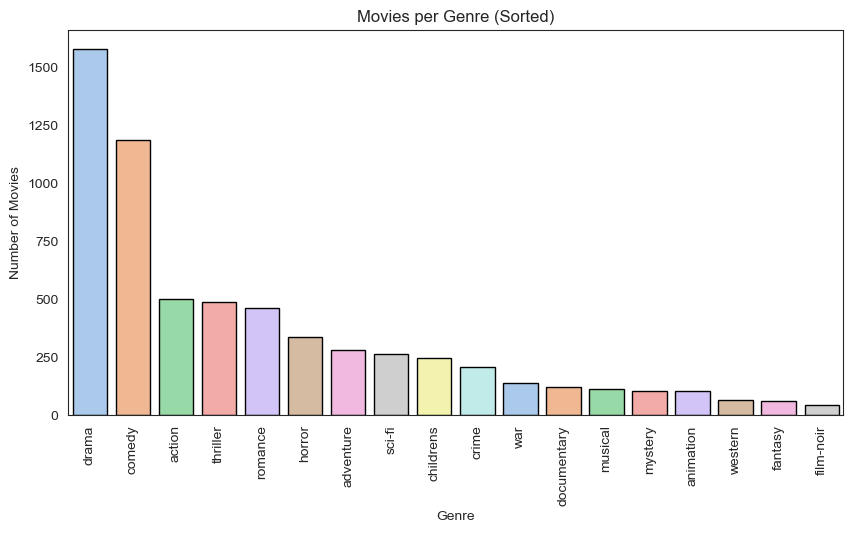

In [67]:
genre_list=['action', 'adventure','animation', 'childrens', 'comedy', 'crime',
                'documentary', 'drama','fantasy', 'film-noir', 'horror', 'musical',
                            'mystery', 'romance', 'sci-fi','thriller', 'war', 'western']
# Sort 'test2' and 'genre_list' in descending order of 'test2'
sorted_indices = np.argsort(test2)[::-1]
test2_sorted = test2[sorted_indices]
genre_list_sorted = np.array(genre_list)[sorted_indices]

# Plot the sorted data
x = np.arange(len(test2_sorted))
plt.figure(figsize=(10, 5))
sns.barplot(x=x, y=test2_sorted, palette='pastel', edgecolor='black')
plt.xticks(x, genre_list_sorted, rotation='vertical')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.title('Movies per Genre (Sorted)')
sns.set(font_scale=1.5)
plt.show()

## *Insights:*
- drama has highest value count of gener

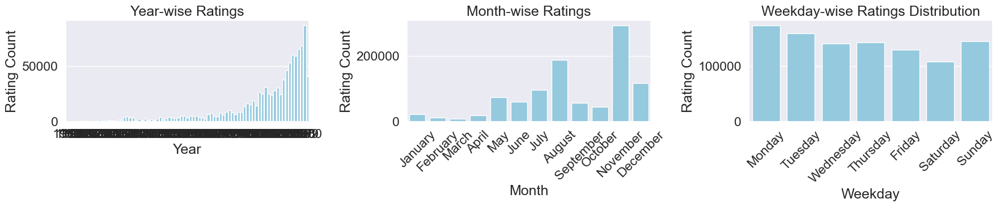

In [68]:
# Year-wise Ratings Distribution
plt.figure(figsize=(18, 4))
plt.subplot(1, 3, 1)
sns.countplot(x='Year', data=data, color='skyblue')
plt.title('Year-wise Ratings')
plt.xlabel('Year')
plt.ylabel('Rating Count')

# Month-wise Ratings Distribution
month_map = {
    1: 'January',
    2: 'February',
    3: 'March',
    4: 'April',
    5: 'May',
    6: 'June',
    7: 'July',
    8: 'August',
    9: 'September',
    10: 'October',
    11: 'November',
    12: 'December'
}



# Map the weekday numbers to actual weekday names
data['Month_name'] = data['Month'].map(month_map)
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
plt.subplot(1, 3, 2)
sns.countplot(x=pd.Categorical(data['Month_name'], categories=month_order, ordered=True), 
              color='skyblue')
plt.title('Month-wise Ratings')
plt.xticks(rotation=45)
plt.xlabel('Month')
plt.ylabel('Rating Count')

# Weekday-wise Ratings Distribution
# Map numeric weekdays to weekday names
weekday_map = {
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'
}

# Map the weekday numbers to actual weekday names
data['DayOfWeek_name'] = data['DayOfWeek'].map(weekday_map)

# Corrected Plot
plt.subplot(1, 3, 3)
week_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.countplot(x=pd.Categorical(data['DayOfWeek_name'], categories=week_order, ordered=True), 
              color='skyblue')
plt.title('Weekday-wise Ratings Distribution')
plt.xticks(rotation=45)
plt.xlabel('Weekday')
plt.ylabel('Rating Count')
plt.tight_layout()
plt.show()


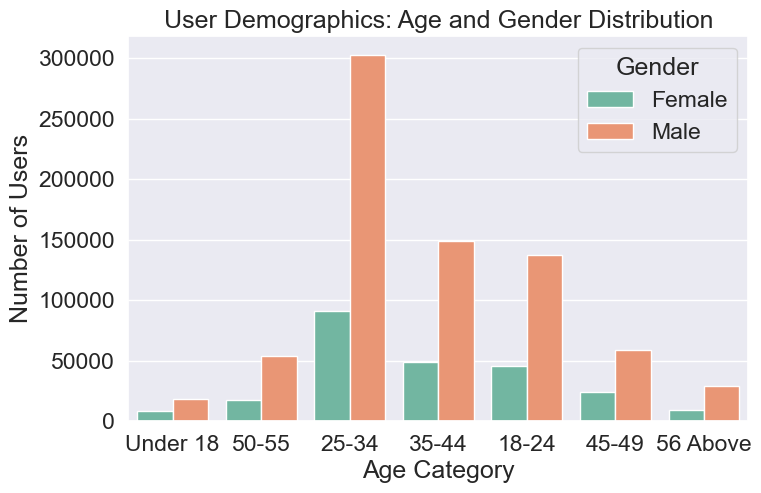

In [69]:
plt.figure(figsize=(8, 5))
sns.countplot(x='Age', hue='Gender', data=data, palette='Set2')
plt.title('User Demographics: Age and Gender Distribution')
plt.xlabel('Age Category')
plt.ylabel('Number of Users')
plt.legend(title='Gender')
plt.show()

## Recommendations systems

In [71]:
matrix = pd.pivot_table(data,index='UserID',columns='Title',values='Rating',aggfunc='mean')
matrix.head()

Title   $1,000,000 Duck  'Night Mother  'Til There Was You  'burbs, The  \
UserID                                                                    
1                   NaN            NaN                 NaN          NaN   
10                  NaN            NaN                 NaN         4.00   
100                 NaN            NaN                 NaN          NaN   
1000                NaN            NaN                 NaN          NaN   
1001                NaN            NaN                 NaN          NaN   

Title   ...And Justice for All  1-900  10 Things I Hate About You  \
UserID                                                              
1                          NaN    NaN                         NaN   
10                         NaN    NaN                         NaN   
100                        NaN    NaN                         NaN   
1000                       NaN    NaN                         NaN   
1001                       NaN    NaN                         NaN   

Title   101 Dalmatians  12 Angry Men  13th Warrior, The  187  \
UserID                                                         
1                  NaN           NaN                NaN  NaN   
10                 NaN          3.00               4.00  NaN   
100                NaN           NaN                NaN  NaN   
1000              4.00           NaN                NaN  NaN   
1001              3.00           NaN                NaN  NaN   

Title   2 Days in the Valley  20 Dates  20,000 Leagues Under the Sea  \
UserID                                                                 
1                        NaN       NaN                           NaN   
10                       NaN       NaN                          4.00   
100                      NaN       NaN                           NaN   
1000                     NaN       NaN                           NaN   
1001                     NaN       NaN                           NaN   

Title   200 Cigarettes  2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
UserID                                                                         
1                  NaN                    NaN   NaN                      NaN   
10                 NaN                   3.00   NaN                      NaN   
100                NaN                   4.00   NaN                      NaN   
1000               NaN                    NaN   NaN                      NaN   
1001              1.00                    NaN   NaN                      NaN   

Title   24-hour Woman  28 Days  3 Ninjas: High Noon On Mega Mountain  \
UserID                                                                 
1                 NaN      NaN                                   NaN   
10                NaN      NaN                                   NaN   
100               NaN      NaN                                   NaN   
1000              NaN      NaN                                   NaN   
1001              NaN      NaN                                   NaN   

Title   3 Strikes  301, 302  39 Steps, The  \
UserID                                       
1             NaN       NaN            NaN   
10            NaN       NaN            NaN   
100           NaN       NaN            NaN   
1000          NaN       NaN            NaN   
1001          NaN       NaN            NaN   

Title   400 Blows, The (Les Quatre cents coups)  42 Up  52 Pick-Up   54  \
UserID                                                                    
1                                           NaN    NaN         NaN  NaN   
10                                          NaN    NaN         NaN  NaN   
100                                         NaN    NaN         NaN  NaN   
1000                                        NaN    NaN         NaN  NaN   
1001                                        NaN    NaN         NaN 2.00   

Title   7th Voyage of Sinbad, The  8 1/2  8 1/2 Women  \
UserID                                                  
1      

In [72]:
# Imputing 'NaN' values with Zero rating
matrix.fillna(0,inplace=True)

In [73]:
matrix.shape

(6040, 3640)

In [74]:
matrix.head()

Title   $1,000,000 Duck  'Night Mother  'Til There Was You  'burbs, The  \
UserID                                                                    
1                  0.00           0.00                0.00         0.00   
10                 0.00           0.00                0.00         4.00   
100                0.00           0.00                0.00         0.00   
1000               0.00           0.00                0.00         0.00   
1001               0.00           0.00                0.00         0.00   

Title   ...And Justice for All  1-900  10 Things I Hate About You  \
UserID                                                              
1                         0.00   0.00                        0.00   
10                        0.00   0.00                        0.00   
100                       0.00   0.00                        0.00   
1000                      0.00   0.00                        0.00   
1001                      0.00   0.00                        0.00   

Title   101 Dalmatians  12 Angry Men  13th Warrior, The  187  \
UserID                                                         
1                 0.00          0.00               0.00 0.00   
10                0.00          3.00               4.00 0.00   
100               0.00          0.00               0.00 0.00   
1000              4.00          0.00               0.00 0.00   
1001              3.00          0.00               0.00 0.00   

Title   2 Days in the Valley  20 Dates  20,000 Leagues Under the Sea  \
UserID                                                                 
1                       0.00      0.00                          0.00   
10                      0.00      0.00                          4.00   
100                     0.00      0.00                          0.00   
1000                    0.00      0.00                          0.00   
1001                    0.00      0.00                          0.00   

Title   200 Cigarettes  2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
UserID                                                                         
1                 0.00                   0.00  0.00                     0.00   
10                0.00                   3.00  0.00                     0.00   
100               0.00                   4.00  0.00                     0.00   
1000              0.00                   0.00  0.00                     0.00   
1001              1.00                   0.00  0.00                     0.00   

Title   24-hour Woman  28 Days  3 Ninjas: High Noon On Mega Mountain  \
UserID                                                                 
1                0.00     0.00                                  0.00   
10               0.00     0.00                                  0.00   
100              0.00     0.00                                  0.00   
1000             0.00     0.00                                  0.00   
1001             0.00     0.00                                  0.00   

Title   3 Strikes  301, 302  39 Steps, The  \
UserID                                       
1            0.00      0.00           0.00   
10           0.00      0.00           0.00   
100          0.00      0.00           0.00   
1000         0.00      0.00           0.00   
1001         0.00      0.00           0.00   

Title   400 Blows, The (Les Quatre cents coups)  42 Up  52 Pick-Up   54  \
UserID                                                                    
1                                          0.00   0.00        0.00 0.00   
10                                         0.00   0.00        0.00 0.00   
100                                        0.00   0.00        0.00 0.00   
1000                                       0.00   0.00        0.00 0.00   
1001                                       0.00   0.00        0.00 2.00   

Title   7th Voyage of Sinbad, The  8 1/2  8 1/2 Women  \
UserID                                                  
1      

In [75]:
# Checking data sparsity
n_users = data['UserID'].nunique()
n_movies = data['MovieID'].nunique()
sparsity = round(1.0 - data.shape[0] / float( n_users * n_movies), 3)
print('The sparsity level of dataset is ' +  str(sparsity * 100) + '%')

The sparsity level of dataset is 95.5%


## Pearson Correlation:
Correlation is a measure that tells how closely two variables move in the same or opposite direction. A positive value indicates that they move in the same direction (i.e. if one increases other increases), where as a negative value indicates the opposite.

The most popular correlation measure for numerical data is Pearson’s Correlation. This measures the degree of linear relationship between two numeric variables and lies between -1 to +1. It is represented by ‘r’.

- r = 1 means perfect positive correlation
- r = -1 means perfect negative correlation
- r = 0 means no linear correlation (note, it does not mean no correlation)

**We will take a movie name as an input from the user and see which other 5 (five) movies have maximum correlation with it.**

In [78]:
data[data['Title']=='Toy Story']

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,State_US,Month,Day,DayOfWeek,isWeekend,isHoliday,ReleaseYear,Month_name,DayOfWeek_name
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,2001-01-06 23:37:48,Female,Under 18,k-12 student,48067,Michigan,1,6,5,1,0,90s,January,Saturday
1,1,Toy Story,"[Animation, Children's, Comedy]",1995,6,4,2000-12-31 04:30:08,Female,50-55,homemaker,55117,Minnesota,12,31,6,1,0,90s,December,Sunday
2,1,Toy Story,"[Animation, Children's, Comedy]",1995,8,4,2000-12-31 03:31:36,Male,25-34,programmer,11413,New York,12,31,6,1,0,90s,December,Sunday
3,1,Toy Story,"[Animation, Children's, Comedy]",1995,9,5,2000-12-31 01:25:52,Male,25-34,technician/engineer,61614,Illinois,12,31,6,1,0,90s,December,Sunday
4,1,Toy Story,"[Animation, Children's, Comedy]",1995,10,5,2000-12-31 01:34:34,Female,35-44,academic/educator,95370,California,12,31,6,1,0,90s,December,Sunday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2072,1,Toy Story,"[Animation, Children's, Comedy]",1995,6022,5,2000-04-26 13:29:23,Male,25-34,technician/engineer,57006,South Dakota,4,26,2,0,0,90s,April,Wednesday
2073,1,Toy Story,"[Animation, Children's, Comedy]",1995,6025,5,2000-04-27 05:21:07,Female,25-34,academic/educator,32607,Florida,4,27,3,0,0,90s,April,Thursday
2074,1,Toy Story,"[Animation, Children's, Comedy]",1995,6032,4,2000-04-26 03:02:07,Male,45-49,executive/managerial,55108,Minnesota,4,26,2,0,0,90s,April,Wednesday
2075,1,Toy Story,"[Animation, Children's, Comedy]",1995,6035,4,2000-04-26 01:34:09,Female,25-34,academic/educator,78734,Texas,4,26,2,0,0,90s,April,Wednesday


In [79]:
data.Title

0              Toy Story
1              Toy Story
2              Toy Story
3              Toy Story
4              Toy Story
               ...      
996139    Contender, The
996140    Contender, The
996141    Contender, The
996142    Contender, The
996143    Contender, The
Name: Title, Length: 996144, dtype: object

In [80]:
# movie_name = input("Enter a movie name: ")
movie_name = 'Toy Story'

# Taking the ratings of that movie
movie_rating = matrix[movie_name]
movie_rating

UserID
1      5.00
10     5.00
100    0.00
1000   5.00
1001   4.00
       ... 
995    0.00
996    4.00
997    4.00
998    0.00
999    0.00
Name: Toy Story, Length: 6040, dtype: float64

In [81]:
# Finding similar movies
similar_movies = matrix.corrwith(movie_rating)
print(f"similar movies :{similar_movies}")
# Creating a dataframe
similar_movies_df = pd.DataFrame(similar_movies, columns=['Correlation'])

# Sorting the values based on correlation
similar_movies_df.sort_values('Correlation', ascending=False, inplace=True)

# Top 5 correlated movies.
similar_movies_df.iloc[1:, :].head()

similar movies :Title
$1,000,000 Duck                       0.05
'Night Mother                         0.04
'Til There Was You                    0.04
'burbs, The                           0.14
...And Justice for All                0.05
                                      ... 
Zed & Two Noughts, A                  0.02
Zero Effect                           0.19
Zero Kelvin (Kjærlighetens kjøtere)   0.01
Zeus and Roxanne                      0.04
eXistenZ                              0.08
Length: 3640, dtype: float64


,Correlation
Title,
Toy Story 2,0.49
Aladdin,0.47
"Lion King, The",0.41
Groundhog Day,0.41
"Bug's Life, A",0.40


## Cosine Similarty:
Cosine similarity is a measure of similarity between two sequences of numbers. Those sequences are viewed as vectors in a higher dimensional space, and the cosine similarity is defined as the cosine of the angle between them, i.e. the dot product of the vectors divided by the product of their lengths.

The cosine similarity always belongs to the interval [-1,1]. For example, two proportional vectors have a cosine similarity of 1, two orthogonal vectors have a similarity of 0, and two opposite vectors have a similarity of -1.

### Item-Based Similarity:

In [84]:
# Finding the similarity values between item-item using cosine_similarity
item_similarity = cosine_similarity(matrix.T)
item_similarity

array([[1.        , 0.07235746, 0.03701053, ..., 0.        , 0.12024178,
        0.02700277],
       [0.07235746, 1.        , 0.11528952, ..., 0.        , 0.        ,
        0.07780705],
       [0.03701053, 0.11528952, 1.        , ..., 0.        , 0.04752635,
        0.0632837 ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.04564448],
       [0.12024178, 0.        , 0.04752635, ..., 0.        , 1.        ,
        0.04433508],
       [0.02700277, 0.07780705, 0.0632837 , ..., 0.04564448, 0.04433508,
        1.        ]])

In [85]:
# Item-similarity Matrix
item_similarity_matrix = pd.DataFrame(item_similarity, index=matrix.columns, columns=matrix.columns)
item_similarity_matrix.head()

Title                   $1,000,000 Duck  'Night Mother  'Til There Was You  \
Title                                                                        
$1,000,000 Duck                    1.00           0.07                0.04   
'Night Mother                      0.07           1.00                0.12   
'Til There Was You                 0.04           0.12                1.00   
'burbs, The                        0.08           0.12                0.10   
...And Justice for All             0.06           0.16                0.07   

Title                   'burbs, The  ...And Justice for All  1-900  \
Title                                                                
$1,000,000 Duck                0.08                    0.06   0.00   
'Night Mother                  0.12                    0.16   0.00   
'Til There Was You             0.10                    0.07   0.08   
'burbs, The                    1.00                    0.14   0.00   
...And Justice for All         0.14                    1.00   0.00   

Title                   10 Things I Hate About You  101 Dalmatians  \
Title                                                                
$1,000,000 Duck                               0.06            0.19   
'Night Mother                                 0.08            0.14   
'Til There Was You                            0.13            0.13   
'burbs, The                                   0.19            0.25   
...And Justice for All                        0.08            0.18   

Title                   12 Angry Men  13th Warrior, The  187  \
Title                                                          
$1,000,000 Duck                 0.09               0.06 0.03   
'Night Mother                   0.11               0.05 0.06   
'Til There Was You              0.08               0.07 0.02   
'burbs, The                     0.17               0.20 0.10   
...And Justice for All          0.21               0.12 0.11   

Title                   2 Days in the Valley  20 Dates  \
Title                                                    
$1,000,000 Duck                         0.02      0.02   
'Night Mother                           0.11      0.04   
'Til There Was You                      0.07      0.09   
'burbs, The                             0.18      0.05   
...And Justice for All                  0.20      0.04   

Title                   20,000 Leagues Under the Sea  200 Cigarettes  \
Title                                                                  
$1,000,000 Duck                                 0.14            0.09   
'Night Mother                                   0.07            0.14   
'Til There Was You                              0.03            0.20   
'burbs, The                                     0.19            0.24   
...And Justice for All                          0.17            0.11   

Title                   2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
Title                                                                          
$1,000,000 Duck                          0.07  0.04                     0.00   
'Night Mother                            0.10  0.08                     0.06   
'Til There Was You                       0.06  0.04                     0.00   
'burbs, The                              0.20  0.19                     0.00   
...And Justice for All                   0.22  0.15                     0.08   

Title                   24-hour Woman  28 Days  \
Title                                            
$1,000,000 Duck                  0.00     0.06   
'Night Mother                    0.06     0.06   
'Til There Was You               0.17     0.12   
'burbs, The                      0.04     0.12   
...And Justice for All           0.02     0.09   

Title                   3 Ninjas: High Noon On Mega Mountain  3 Strikes  \
Title                                                                     
$1,000,000 Duck                                 

### User-Based Similarity:

In [87]:
# Finding the similarity values between user-user using cosine_similarity
user_similarity = cosine_similarity(matrix)
user_similarity

array([[1.        , 0.25531859, 0.12396703, ..., 0.15926709, 0.11935626,
        0.12239079],
       [0.25531859, 1.        , 0.25964457, ..., 0.16569953, 0.13332665,
        0.24845029],
       [0.12396703, 0.25964457, 1.        , ..., 0.20430203, 0.11352239,
        0.30693676],
       ...,
       [0.15926709, 0.16569953, 0.20430203, ..., 1.        , 0.18657496,
        0.18563871],
       [0.11935626, 0.13332665, 0.11352239, ..., 0.18657496, 1.        ,
        0.10827118],
       [0.12239079, 0.24845029, 0.30693676, ..., 0.18563871, 0.10827118,
        1.        ]])

In [88]:
# Item-similarity Matrix
user_similarity_matrix = pd.DataFrame(user_similarity, index=matrix.index, columns=matrix.index)
user_similarity_matrix.head()

UserID    1   10  100  1000  1001  1002  1003  1004  1005  1006  1007  1008  \
UserID                                                                        
1      1.00 0.26 0.12  0.21  0.14  0.11  0.12  0.18  0.10  0.05  0.06  0.10   
10     0.26 1.00 0.26  0.28  0.16  0.11  0.14  0.43  0.19  0.10  0.16  0.22   
100    0.12 0.26 1.00  0.31  0.08  0.11  0.36  0.24  0.17  0.10  0.06  0.04   
1000   0.21 0.28 0.31  1.00  0.10  0.05  0.20  0.36  0.33  0.13  0.04  0.08   
1001   0.14 0.16 0.08  0.10  1.00  0.16  0.05  0.15  0.14  0.13  0.02  0.08   

UserID  1009  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  \
UserID                                                                          
1       0.05 0.03  0.16  0.08  0.08  0.05  0.20  0.18  0.13  0.15  0.18  0.11   
10      0.12 0.21  0.35  0.20  0.15  0.16  0.16  0.39  0.20  0.29  0.24  0.33   
100     0.06 0.35  0.26  0.14  0.09  0.02  0.30  0.20  0.17  0.15  0.34  0.19   
1000    0.12 0.28  0.25  0.12  0.12  0.05  0.18  0.22  0.09  0.20  0.36  0.20   
1001    0.20 0.07  0.25  0.07  0.04  0.07  0.06  0.30  0.29  0.10  0.07  0.17   

UserID  102  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                         
1      0.12  0.03  0.09  0.12  0.10  0.02  0.03  0.00  0.14  0.05  0.19 0.03   
10     0.16  0.11  0.19  0.11  0.13  0.14  0.08  0.04  0.15  0.08  0.30 0.15   
100    0.01  0.18  0.20  0.07  0.09  0.07  0.07  0.03  0.21  0.10  0.16 0.22   
1000   0.10  0.14  0.17  0.06  0.05  0.02  0.12  0.03  0.15  0.07  0.22 0.17   
1001   0.18  0.15  0.10  0.27  0.05  0.07  0.12  0.13  0.08  0.05  0.16 0.10   

UserID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  1040  \
UserID                                                                          
1       0.05  0.06  0.18  0.03  0.19  0.14  0.14  0.02  0.18  0.03 0.05  0.17   
10      0.24  0.27  0.23  0.20  0.33  0.13  0.17  0.05  0.18  0.06 0.09  0.33   
100     0.40  0.39  0.09  0.14  0.16  0.22  0.19  0.05  0.13  0.00 0.03  0.23   
1000    0.34  0.32  0.14  0.13  0.23  0.13  0.13  0.06  0.09  0.00 0.07  0.23   
1001    0.09  0.08  0.23  0.10  0.15  0.10  0.08  0.20  0.16  0.08 0.13  0.13   

UserID  1041  1042  1043  1044  1045  1046  1047  1048  1049  105  1050  1051  \
UserID                                                                          
1       0.05  0.08  0.08  0.15  0.06  0.03  0.14  0.15  0.07 0.10  0.14  0.25   
10      0.07  0.25  0.10  0.23  0.10  0.13  0.26  0.10  0.11 0.16  0.28  0.46   
100     0.08  0.05  0.09  0.19  0.00  0.09  0.26  0.14  0.18 0.26  0.16  0.21   
1000    0.04  0.05  0.06  0.26  0.04  0.09  0.20  0.05  0.09 0.45  0.14  0.24   
1001    0.08  0.02  0.06  0.02  0.14  0.05  0.14  0.19  0.14 0.05  0.37  0.31   

UserID  1052  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                          
1       0.06  0.05  0.05  0.14  0.06  0.21  0.12  0.21 0.05  0.00  0.18  0.15   
10      0.14  0.19  0.23  0.20  0.14  0.30  0.34  0.34 0.17  0.11  0.16  0.29   
100     0.05  0.27  0.11  0.05  0.04  0.26  0.32  0.21 0.09  0.11  0.05  0.08   
1000    0.02  0.33  0.15  0.11  0.16  0.29  0.28  0.21 0.06  0.10  0.20  0.20   
1001    0.05  0.15  0.13  0.17  0.04  0.17  0.25  0.25 0.07  0.13  0.08  0.12   

UserID  1063  1064  1065  1066  1067  1068  1069  107  1070  1071  1072  1073  \
UserID                                                                          
1       0.10  0.12  0.03  0.10  0.12  0.24  0.03 0.12  0.04  0.07  0.23  0.07   
10      0.25  0.20  0.13  0.28  0.19  0.39  0.12 0.19  0.02  0.19  0.24  0.17   
100     0.26  0.17  0.03  0.20  0.18  0.19  0.10 0.17  0.13  0.19  0.17  0.13   
1000    0.30  0.15  0.01  0.14  0.11  0.18  0.04 0.13  0.04  0.11  0.17  0.09   
1001    0.14  0.24  0.21  0.13  0.17  0.23  0.29 0.04  0.08  0.12  0.15  0.11   

UserID  1074  1075  1076  1077  1078  1079  1

## Nearest Neighbors:

In [90]:
model_knn = NearestNeighbors(metric='cosine')
model_knn.fit(matrix.T)

NearestNeighbors(metric='cosine')

In [91]:
# The distances and indices are being calculated with neighbors being 6
distances, indices = model_knn.kneighbors(matrix.T, n_neighbors=6)

In [92]:
# The result dataframe consits of the different indices of movies based on the distance
result = pd.DataFrame(indices, columns=['Title1', 'Title2', 'Title3', 'Title4', 'Title5','Title6'])
result.head()

,Title1,Title2,Title3,Title4,Title5,Title6
0,0,735,416,286,584,3247
1,1,807,72,2167,3036,3369
2,2,1627,2529,3320,2588,1999
3,3,1457,2169,1308,1047,3511
4,4,26,726,894,495,944


In [93]:
# With this for loop replacing the indices in the 'result' dataframe with movie titles of that corresponding ones
result2 = result.copy()
for i in range(1, 7):
    mov = pd.DataFrame(matrix.T.index).reset_index()
    mov = mov.rename(columns={'index':f'Title{i}'})
    result2 = pd.merge(result2, mov, on=[f'Title{i}'], how='left')
    result2 = result2.drop(f'Title{i}', axis=1)
    result2 = result2.rename(columns={'Title':f'Title{i}'})
result2.head()

,Title1,Title2,Title3,Title4,Title5,Title6
0,"$1,000,000 Duck","Computer Wore Tennis Shoes, The",Blackbeard's Ghost,"Barefoot Executive, The",Candleshoe,That Darn Cat!
1,'Night Mother,"Cry in the Dark, A",Agnes of God,Mommie Dearest,Sophie's Choice,"Trip to Bountiful, The"
2,'Til There Was You,If Lucy Fell,Picture Perfect,To Gillian on Her 37th Birthday,Practical Magic,Mad Love
3,"'burbs, The",Harry and the Hendersons,"Money Pit, The",Ghostbusters II,European Vacation,Weekend at Bernie's
4,...And Justice for All,52 Pick-Up,Coma,Deliverance,"Boys from Brazil, The",Dog Day Afternoon


In [94]:
# movie_name = input("Enter a movie name: ")
movie_name = 'Liar Liar'

# 3 nearest movies for the movie present in Title1.
result2.loc[result2['Title1']==movie_name]

,Title1,Title2,Title3,Title4,Title5,Title6
1887,Liar Liar,Mrs. Doubtfire,Ace Ventura: Pet Detective,Dumb & Dumber,Home Alone,Wayne's World


## Matrix Factorization(Using cmfrec Library):

In [96]:
# Creating a pivot table of movie titles and userid and ratings are taken as values
rm = data.pivot(index= 'UserID', columns= 'MovieID', values = 'Rating').fillna(0)
rm.head()

MovieID    1   10  100  1000  1002  1003  1004  1005  1006  1007  1008  1009  \
UserID                                                                         
1       5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
10      5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  5.00   
100     0.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1000    5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1001    4.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   

MovieID  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  102  \
UserID                                                                          
1       0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
10      0.00  0.00  0.00  3.00  0.00  0.00  3.00  5.00  0.00  0.00  4.00 0.00   
100     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1001    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                     
1        0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  5.00  5.00 0.00   
10       3.00  0.00  5.00  5.00  0.00  4.00  0.00  0.00  5.00  0.00 0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  3.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 0.00   
10       3.00  4.00  4.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 3.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  4.00  0.00  0.00  0.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1040  1041  1042  1043  1044  1046  1047  1049  105  1050  1051  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
10       0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   

MovieID  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00  5.00 0.00  0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00  0.00   

MovieID  1063  1064  1066  1067  1068  1069  107  1070  1071  1073  1076  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  5.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1001     2.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   

MovieID  1077  1078  1079  108  1080  1081  1082  1083  1084  1085  1086  \
UserID                                                                     
1        0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00

In [97]:
rm_raw = data[['UserID', 'MovieID', 'Rating']].copy()
rm_raw.columns = ['UserId', 'ItemId', 'Rating']

# Lib requires specific column names
rm_raw.head()

,UserId,ItemId,Rating
0,1,1,5
1,6,1,4
2,8,1,4
3,9,1,5
4,10,1,5


In [98]:
print(rm_raw.shape)
print("No.of Users:",len(rm_raw['UserId'].unique()))
print("No.of Items:",len(rm_raw['ItemId'].unique()))

(996144, 3)
No.of Users: 6040
No.of Items: 3682


- An instance of the CMF model is created with various hyperparameters:

 - **method="als":** Specifies the alternating least squares (ALS) optimization method, commonly used for matrix factorization in recommendation systems.

 - **k=2:** Sets the number of latent factors to 2, determining the dimensionality of the latent factor space.

 - **lambda_=0.1:** Sets the regularization strength to 0.1. Regularization is used to prevent overfitting in the model.

 - **user_bias=False:** Indicates that user bias terms are not included in the model. User bias represents a user's overall rating tendency.

 - **item_bias=False:** Excludes item bias terms in the model. Item bias represents an item's overall rating tendency.

 - **verbose=False:** Suppresses verbose output, controlling whether the model's training progress is displayed.

In [100]:
model = CMF(k = 2, lambda_ = 0.1, verbose = False, user_bias= False, item_bias=False)
model.fit(rm_raw)

Collective matrix factorization model
(explicit-feedback variant)


In [101]:
# model.A_ gives the embeddings of Users and model.B_ gives the embeddings of Items
model.A_.shape, model.B_.shape

((6040, 2), (3682, 2))

In [102]:
# Average rating and Global Mean
rm_raw.Rating.mean(), model.glob_mean_

(3.57998542379415, 3.5799853801727295)

In [103]:
# Calculating the predicted ratings
rm__ = np.dot(model.A_, model.B_.T) + model.glob_mean_

In [104]:
# 1) Create boolean mask where actual ratings exist
mask = rm.values > 0  # assumes rm is a pandas DataFrame

# 2) Flatten the relevant values
actual    = rm.values[mask].astype(float)   # rm is a DataFrame
predicted = rm__[mask].astype(float)        # rm__ is already a NumPy array

# 3) Compute RMSE
rmse_val = np.sqrt(np.mean((actual - predicted) ** 2))
print(f"Root Mean Squared Error: {rmse_val:.3f}")


Root Mean Squared Error: 1.391


In [105]:
# Calculating mape value
mape = mean_absolute_percentage_error(rm.values[rm>0],rm__[rm>0])
print('Mean Absolute Percentage Error : {:.3f}'.format(mape))

Mean Absolute Percentage Error : 0.416


- **The rmse is 1.391 and mape is 0.416 for matrix factorization.**

In [107]:
def topN(self, user, n):
    # Compute predictions for the specified user
    user_predictions = np.dot(self.A_[user, :], self.B_.T) + self.glob_mean_

    # Get top N item indices with the highest predicted ratings
    top_items_indices = np.argsort(user_predictions)[-n:][::-1]

    return top_items_indices

In [108]:
# Getting top 10 recommended items for user 1
user = 1
top_10_items = topN(model, user, n=10)
print("Top 10 recommended items for user {}: {}".format(user, top_10_items))

Top 10 recommended items for user 1: [1308 2687 3622  827 2602  619 3087 3551 3279 3131]


In [109]:
# Retrieve corresponding item titles
top_10_titles = [data['Title'][i] for i in top_10_items]

print("Top 10 recommended items for user {}: {}".format(user, top_10_titles))

Top 10 recommended items for user 1: ['Toy Story', 'Jumanji', 'Father of the Bride Part II', 'Toy Story', 'Jumanji', 'Toy Story', 'Grumpier Old Men', 'Father of the Bride Part II', 'Waiting to Exhale', 'Grumpier Old Men']


### Embeddings for item-item similarity:

In [111]:
# Get item embeddings
item_embeddings = model.B_

# Compute similarity matrix
item_similarity = cosine_similarity(item_embeddings).round(2)
print("Item-Item Similarity Matrix:\n", item_similarity)

Item-Item Similarity Matrix:
 [[ 1.   -0.16 -0.34 ...  0.78  0.98  0.9 ]
 [-0.16  1.    0.98 ...  0.49  0.03  0.29]
 [-0.34  0.98  1.   ...  0.32 -0.16  0.11]
 ...
 [ 0.78  0.49  0.32 ...  1.    0.88  0.98]
 [ 0.98  0.03 -0.16 ...  0.88  1.    0.97]
 [ 0.9   0.29  0.11 ...  0.98  0.97  1.  ]]


In [112]:
item_similarity_matrix=pd.DataFrame(item_similarity,index=rm_raw['ItemId'].unique(),columns=rm_raw['ItemId'].unique())
item_similarity_matrix.head() #Item similarity matrix using the embeddings from matrix factorization

1     2     3     4     5     6    7     8     9   10   11    12   13  \
1  1.00 -0.16 -0.34 -0.47 -0.30  0.97 0.10 -0.21 -0.47 0.33 0.76 -0.65 0.03   
2 -0.16  1.00  0.98  0.95  0.99  0.10 0.97  1.00  0.95 0.88 0.52  0.86 0.98   
3 -0.34  0.98  1.00  0.99  1.00 -0.09 0.90  0.99  0.99 0.78 0.36  0.94 0.93   
4 -0.47  0.95  0.99  1.00  0.98 -0.23 0.83  0.96  1.00 0.68 0.22  0.98 0.87   
5 -0.30  0.99  1.00  0.98  1.00 -0.05 0.92  1.00  0.98 0.80 0.39  0.92 0.94   

    14    15    16    17    18    19    20   21   22    23    24   25   26  \
1 0.63 -0.48  0.92  1.00 -0.04 -0.59 -0.54 0.73 0.08 -0.46 -0.18 0.87 0.66   
2 0.66  0.94  0.25 -0.09  0.99  0.89  0.92 0.55 0.97  0.95  1.00 0.35 0.64   
3 0.51  0.99  0.06 -0.27  0.95  0.96  0.98 0.39 0.91  0.99  0.99 0.17 0.48   
4 0.39  1.00 -0.08 -0.41  0.90  0.99  1.00 0.26 0.84  1.00  0.95 0.03 0.35   
5 0.55  0.98  0.10 -0.23  0.96  0.95  0.97 0.43 0.93  0.99  0.99 0.21 0.52   

     27    28    29    30    31    32    33    34   35    36   37    38   39  \
1 -0.36  1.00  1.00  0.92 -0.23  0.99 -0.42  0.99 0.13  0.99 0.52 -0.69 0.71   
2  0.98 -0.22 -0.18  0.25  1.00 -0.04  0.96 -0.02 0.96 -0.05 0.76  0.83 0.58   
3  1.00 -0.40 -0.36  0.06  0.99 -0.23  1.00 -0.20 0.89 -0.24 0.63  0.92 0.42   
4  0.99 -0.52 -0.49 -0.08  0.97 -0.36  1.00 -0.34 0.81 -0.37 0.51  0.96 0.29   
5  1.00 -0.36 -0.32  0.10  1.00 -0.19  0.99 -0.16 0.90 -0.20 0.66  0.90 0.46   

     40    41    42   43    44   45    46    47    48   49    50   52    53  \
1  0.99  1.00 -0.32 0.30 -0.54 0.38 -0.35  1.00 -0.35 0.74  0.95 0.79  0.86   
2 -0.06 -0.18  0.99 0.89  0.92 0.85  0.98 -0.09  0.98 0.54 -0.47 0.48 -0.65   
3 -0.24 -0.36  1.00 0.79  0.97 0.74  1.00 -0.27  1.00 0.38 -0.62 0.31 -0.78   
4 -0.37 -0.49  0.99 0.70  1.00 0.63  0.99 -0.40  0.99 0.25 -0.73 0.17 -0.86   
5 -0.20 -0.32  1.00 0.82  0.96 0.76  1.00 -0.23  1.00 0.42 -0.59 0.35 -0.75   

     54    55    56   57    58   59    60    61   62    64    65    66   67  \
1 -0.50 -0.13 -0.61 0.38  1.00 0.71 -0.20 -0.41 0.66 -0.66 -0.66 -0.76 0.30   
2  0.94  1.00  0.88 0.85 -0.16 0.59  1.00  0.97 0.64  0.85  0.85  0.76 0.89   
3  0.98  0.98  0.95 0.74 -0.34 0.43  0.99  1.00 0.48  0.93  0.93  0.87 0.80   
4  1.00  0.94  0.99 0.64 -0.47 0.29  0.96  1.00 0.35  0.97  0.97  0.93 0.70   
5  0.98  0.98  0.94 0.77 -0.30 0.46  0.99  0.99 0.52  0.92  0.92  0.85 0.82   

    68   69    70    71   72   73    74    75    76    77    78    79    80  \
1 0.34 0.69 -0.14 -0.62 0.78 0.84 -0.18 -0.44 -0.44  0.89 -0.23 -0.50  1.00   
2 0.87 0.60  1.00  0.87 0.49 0.41  1.00  0.96  0.96  0.31  1.00  0.94 -0.19   
3 0.76 0.45  0.98  0.95 0.32 0.23  0.99  0.99  0.99  0.13  0.99  0.98 -0.37   
4 0.67 0.32  0.94  0.98 0.19 0.09  0.95  1.00  1.00 -0.01  0.97  1.00 -0.50   
5 0.79 0.48  0.99  0.94 0.36 0.27  0.99  0.99  0.99  0.17  1.00  0.98 -0.33   

    81    82   83    84   85   86    87    88    89   90    92    93   94  \
1 0.06  0.98 0.80 -0.84 0.25 0.10 -0.69 -0.50 -0.29 0.79 -0.50 -0.59 0.84   
2 0.98  0.02 0.47  0.67 0.92 0.97  0.83  0.94  0.99 0.48  0.93  0.89 0.40   
3 0.92 -0.17 0.30  0.80 0.83 0.90  0.92  0.99  1.00 0.31  0.98  0.96 0.22   
4 0.86 -0.31 0.16  0.87 0.74 0.83  0.96  1.00  0.98 0.17  1.00  0.99 0.08   
5 0.94 -0.13 0.33  0.77 0.85 0.92  0.90  0.98  1.00 0.35  0.98  0.95 0.26   

     95    96    97    98   99   100   101   102   103  104   105   106   107  \
1 -0.39  0.95  1.00 -0.48 0.63 -0.08  1.00 -0.65 -0.18 0.27 -0.10  0.87 -0.02   
2  0.97 -0.45 -0.06  0.95 0.67  1.00 -0.14  0.85  1.00 0.90  1.00 -0.63  0.99   
3  1.00 -0.61 -0.25  0.99 0.52  0.96 -0.32  0.94  0.99 0.81  0.97 -0.76  0.95   
4  1.00 -0.71 -0.38  1.00 0.39  0.92 -0.45  0.98  0.95 0.72  0.93 -0.84  0.89   
5  1.00 -0.57 -0.21  0.98 0.55  0.97 -0.28  0.92  0.99 0.83  0.98 -0.73  0.96   

   108   110   111  112   113  114   116   117   118   119   120   121   122  \
1 0.16  1.00  0.97 0.13 -0.32 0.05  1.00  0.95 -0.34 -0.55 -0.05  1.00 -0.46   
2 0.95 -0.15 -0.39 0.96  0.99 0.98 -0.10  0.17

In [113]:
movie_name='3945'
movie_rating=item_similarity_matrix[movie_name]
print(movie_rating)

1      -0.71
2       0.81
3       0.90
4       0.95
5       0.89
        ... 
3948    0.19
3949   -0.81
3950   -0.11
3951   -0.56
3952   -0.33
Name: 3945, Length: 3682, dtype: float32


In [114]:
# Finding similar movies
similar_movies=item_similarity_matrix.corrwith(movie_rating)

similar_movies_df=pd.DataFrame(similar_movies,columns=['Correlation'])
similar_movies_df.sort_values('Correlation',ascending=False,inplace=True)

# Top 5 correlated movies
similar_movies_df.iloc[1:, :].head()

,Correlation
2368,1.00
179,1.00
3374,1.00
667,1.00
3946,1.00


In [115]:
similar_movies_df1=similar_movies_df.copy()
similar_movies_df1 = similar_movies_df1.reset_index().rename(columns={'index':'MovieID'}).head(6)
# print(similar_movies_df1.head())

df2=data[['MovieID','Title']].copy()
df2.drop_duplicates(inplace=True)
df2.reset_index(drop=True,inplace=True)
# print(df2.head())

similar_movies = pd.merge(df2, similar_movies_df1, on = 'MovieID', how = 'inner')
similar_movies

,MovieID,Title,Correlation
0,179,Mad Love,1.00
1,667,Bloodsport 2,1.00
2,2368,King Kong Lives,1.00
3,3374,Daughters of the Dust,1.00
4,3945,Digimon: The Movie,1.00
5,3946,Get Carter,1.00


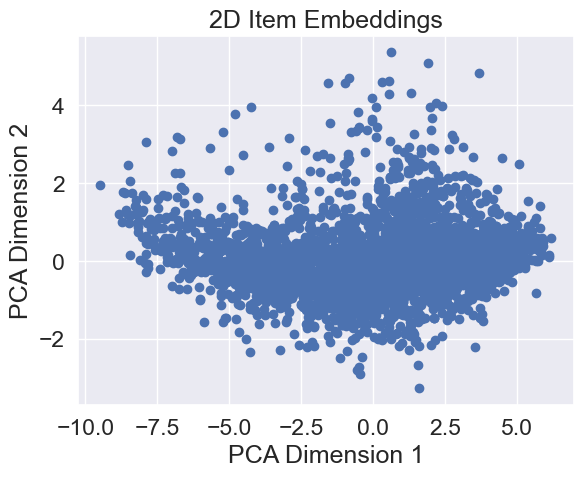

In [116]:
# Reduce item embeddings to 2D
pca = PCA(n_components=2)
item_embeddings_2d = pca.fit_transform(item_embeddings)

# Plot item embeddings
plt.scatter(item_embeddings_2d[:, 0], item_embeddings_2d[:, 1])
plt.title("2D Item Embeddings")
plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.show()

- Items appear **densely clustered around the center**, suggesting that many items share similar features or user interaction patterns.
- Sparse points away from the center indicate unique items or outliers that may differ significantly from the majority.

### Embeddings for user-user similarity:

In [119]:
# Get user embeddings
user_embeddings = model.A_

# Compute similarity matrix
user_similarity = cosine_similarity(user_embeddings).round(2)
print("User-User Similarity Matrix:\n", user_similarity)

User-User Similarity Matrix:
 [[ 1.    1.    0.63 ... -0.39  1.    0.59]
 [ 1.    1.    0.61 ... -0.42  1.    0.57]
 [ 0.63  0.61  1.   ...  0.47  0.61  1.  ]
 ...
 [-0.39 -0.42  0.47 ...  1.   -0.41  0.51]
 [ 1.    1.    0.61 ... -0.41  1.    0.57]
 [ 0.59  0.57  1.   ...  0.51  0.57  1.  ]]


In [120]:
user_similarity_matrix=pd.DataFrame(user_similarity,index=matrix.index,columns=matrix.index)
user_similarity_matrix.head() #User similarity matrix using the embeddings from matrix factorization

UserID     1    10  100  1000  1001  1002  1003  1004  1005  1006  1007  1008  \
UserID                                                                          
1       1.00  1.00 0.63 -0.04  1.00  0.58  0.29 -0.92 -0.79 -0.83 -0.47  0.78   
10      1.00  1.00 0.61 -0.07  0.99  0.56  0.26 -0.93 -0.81 -0.85 -0.49  0.76   
100     0.63  0.61 1.00  0.75  0.70  1.00  0.92 -0.28 -0.03 -0.10  0.39  0.98   
1000   -0.04 -0.07 0.75  1.00  0.05  0.79  0.95  0.43  0.64  0.59  0.90  0.60   
1001    1.00  0.99 0.70  0.05  1.00  0.66  0.38 -0.88 -0.73 -0.78 -0.39  0.83   

UserID  1009  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  \
UserID                                                                          
1       0.93 0.50  0.32 -0.80 -0.49  0.24  0.94  0.25  0.19  1.00 -0.15  0.37   
10      0.92 0.48  0.30 -0.82 -0.52  0.21  0.93  0.22  0.16  0.99 -0.18  0.34   
100     0.88 0.99  0.94 -0.04  0.36  0.90  0.86  0.91  0.88  0.70  0.67  0.95   
1000    0.34 0.84  0.93  0.63  0.89  0.96  0.31  0.96  0.97  0.05  0.99  0.91   
1001    0.96 0.58  0.41 -0.74 -0.41  0.32  0.96  0.34  0.28  1.00 -0.06  0.45   

UserID   102  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                          
1       0.94  0.74 -0.12  0.77  0.05 -0.65 -0.51 -0.62  1.00  0.68  0.46 0.05   
10      0.95  0.72 -0.15  0.75  0.02 -0.67 -0.54 -0.64  1.00  0.66  0.44 0.03   
100     0.32  0.99  0.69  0.98  0.80  0.18  0.34  0.22  0.67  1.00  0.98 0.81   
1000   -0.39  0.64  1.00  0.61  1.00  0.79  0.88  0.81  0.01  0.70  0.87 1.00   
1001    0.90  0.80 -0.03  0.82  0.14 -0.58 -0.43 -0.54  1.00  0.75  0.54 0.14   

UserID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  1040  \
UserID                                                                          
1       0.43 -0.99  0.98 -0.16 -0.67  0.69 -0.22 -0.91  0.48 -0.80 0.08  0.33   
10      0.40 -0.99  0.97 -0.19 -0.69  0.67 -0.25 -0.92  0.46 -0.81 0.05  0.30   
100     0.97 -0.49  0.78  0.66  0.15  1.00  0.61 -0.26  0.98 -0.03 0.82  0.94   
1000    0.89  0.20  0.17  0.99  0.77  0.69  0.98  0.45  0.86  0.64 0.99  0.93   
1001    0.51 -0.97  0.99 -0.07 -0.60  0.75 -0.14 -0.87  0.56 -0.74 0.17  0.41   

UserID  1041  1042  1043  1044  1045  1046  1047  1048  1049  105  1050  1051  \
UserID                                                                          
1       0.93  0.65  0.73  0.48  0.92  1.00  0.27  0.94 -0.86 0.37  0.13 -0.11   
10      0.91  0.63  0.71  0.45  0.91  1.00  0.24  0.93 -0.88 0.35  0.10 -0.14   
100     0.88  1.00  0.99  0.98  0.88  0.69  0.92  0.86 -0.16 0.96  0.85  0.70   
1000    0.34  0.73  0.66  0.86  0.35  0.03  0.95  0.30  0.54 0.91  0.99  1.00   
1001    0.96  0.72  0.79  0.55  0.95  1.00  0.35  0.97 -0.81 0.46  0.22 -0.02   

UserID  1052  1053  1054  1055  1056  1057  1058  1059   106  1060  1061  \
UserID                                                                     
1       0.49  0.39  0.37  0.68  0.94  0.90 -0.08 -0.37  1.00  0.84  0.71   
10      0.46  0.36  0.34  0.65  0.93  0.89 -0.11 -0.40  1.00  0.83  0.69   
100     0.98  0.96  0.95  1.00  0.86  0.91  0.72  0.49  0.65  0.95  0.99   
1000    0.85  0.91  0.92  0.71  0.30  0.40  1.00  0.94 -0.02  0.51  0.67   
1001    0.56  0.47  0.45  0.74  0.97  0.94  0.01 -0.28  1.00  0.89  0.77   

UserID  1062  1063  1064  1065  1066  1067  1068  1069   107  1070  1071  \
UserID                                                                     
1       0.08  0.50  0.98 -0.22  1.00  0.54  0.51 -0.62 -0.40  0.92  0.79   
10      0.05  0.47  0.98 -0.24  1.00  0.52  0.49 -0.65 -0.43  0.91  0.77   
100     0.82  0.99  0.45  0.62  0.62  0.99  0.99  0.21  0.46  0.88  0.97   
1000    0.99  0.85 -0.26  0.98 -0.06  0.82  0.84  0.80  0.93  0.35  0.58   
1001    0.17  0.57  0.95 -0.13  0.99  0.62  0.59 -0.55 -0.32  0.95  0.84   

UserID  1072  1073  1074  1075  1076  1077  1078  1079   108  1080  1081  \
UserID            

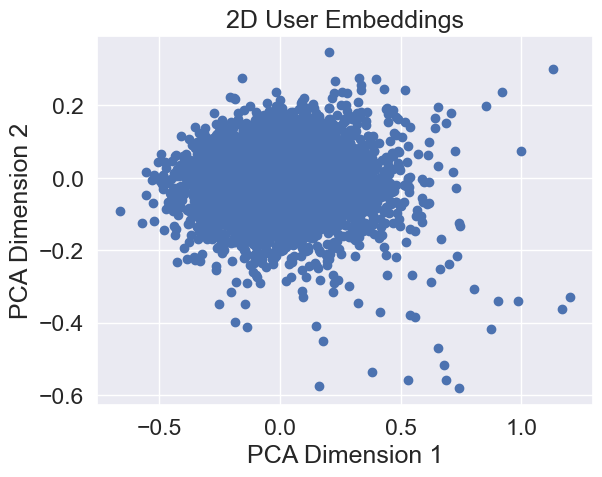

In [121]:
# Reduce user embeddings to 2D
pca = PCA(n_components=2)
user_embeddings_2d = pca.fit_transform(user_embeddings)

# Plot user embeddings
plt.scatter(user_embeddings_2d[:, 0], user_embeddings_2d[:, 1])
plt.title("2D User Embeddings")
plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.show()

- Users appear **densely clustered around the center**, suggesting that most of the users share similar features.

## User-Based Approach:

In [124]:
# Taking 6 movies names in random
mov_name = ['Hamlet', 'Dumb & Dumber', 'Ace Ventura: Pet Detective', 'Home Alone','Robin Hood','It Happened One Night']

In [125]:
# Finding the MovieID's for the above movies
mov_id = []
for movie in mov_name:
    # Check if the movie exists in the dataset
    matching_rows = data[data['Title'] == movie]
    if not matching_rows.empty:
        id = matching_rows['MovieID'].iloc[0]
        mov_id.append(id)
        print(f"MovieID for '{movie}': {id}")
    else:
        print(f"Movie '{movie}' not found in the dataset.")

MovieID for 'Hamlet': 1411
MovieID for 'Dumb & Dumber': 231
MovieID for 'Ace Ventura: Pet Detective': 344
MovieID for 'Home Alone': 586
MovieID for 'Robin Hood': 3034
MovieID for 'It Happened One Night': 905


In [126]:
# Give random user ratings for the movies
mov_rating = [5, 3, 2, 1, 4, 3]

In [127]:
user_choices = pd.DataFrame({'MovieID': mov_id, 'Title': mov_name, 'Rating': mov_rating})
user_choices.sort_values(by='MovieID', inplace = True)

In [128]:
from scipy.stats import pearsonr
# Finding other users who watched the same movies
other_users = data[data['MovieID'].isin(user_choices['MovieID'].values)]
if other_users.empty:
    print("No other users have rated the selected movies.")
else:
    # Group by UserID for movies in common
    common_movies = other_users.groupby('UserID')

    # Sort users by the count of common movies
    common_movies = sorted(common_movies, key=lambda x: len(x[1]), reverse=True)

    # Take the top 100 users
    top_users = common_movies[:100]

    # Calculating Pearson Correlation
    pearson_corr = {}
    for user_id, movies in top_users:
        movies = movies.sort_values(by='MovieID')
        movie_list = movies['MovieID'].values

        # Ratings for common movies
        new_user_ratings = user_choices[user_choices['MovieID'].isin(movie_list)]['Rating'].values
        user_ratings = movies[movies['MovieID'].isin(movie_list)]['Rating'].values

        # Only calculate correlation if sufficient data exists
        if len(new_user_ratings) > 1 and len(user_ratings) > 1:
            corr = pearsonr(new_user_ratings, user_ratings)
            if not pd.isna(corr[0]):  # Check for valid correlation
                pearson_corr[user_id] = corr[0]

In [129]:
# Creating a DataFrame for Similarity Index
pearson_df = pd.DataFrame(columns=['UserID', 'Similarity Index'], data=pearson_corr.items())
pearson_df = pearson_df.sort_values(by='Similarity Index', ascending=False)[:10]

In [130]:
# Merge with original data for recommendations
users_rating = pearson_df.merge(data, on='UserID', how='inner')

In [131]:
# Calculate Weighted Rating
users_rating['Weighted Rating'] = users_rating['Rating'] * users_rating['Similarity Index']
users_rating = users_rating[['UserID', 'MovieID', 'Rating', 'Similarity Index', 'Weighted Rating']]

In [132]:
# Aggregate Weighted Rating and Similarity Index by MovieID
grouped_ratings = users_rating.groupby('MovieID').sum()[['Similarity Index', 'Weighted Rating']]

In [133]:
# Calculate average recommendation score
recommend_movies = pd.DataFrame()
recommend_movies['avg_recommend_score'] = grouped_ratings['Weighted Rating'] / grouped_ratings['Similarity Index']
recommend_movies['MovieID'] = grouped_ratings.index
recommend_movies = recommend_movies.reset_index(drop=True)

In [134]:
# Filter movies with avg_recommend_score >= 4.5
recommend_movies = recommend_movies[recommend_movies['avg_recommend_score'] >= 4.5]

In [135]:
# Recommend top 10 movies
recommendations = data[data['MovieID'].isin(recommend_movies['MovieID'])][['MovieID', 'Title']]
if len(recommendations) > 10:
    recommendations = recommendations.sample(10)

print("Top Recommended Movies:")
print(recommendations)

Top Recommended Movies:
       MovieID                 Title
143130     527      Schindler's List
947733    3683          Blood Simple
214951     908    North by Northwest
50825      176    Living in Oblivion
479542    1719  Sweet Hereafter, The
253094    1041        Secrets & Lies
215207     908    North by Northwest
458606    1633           Ulee's Gold
313799    1212        Third Man, The
319698    1219                Psycho


## The sparse 'row' matrix representation for the following dense matrix -[[1 0][3 7]]

In [137]:
from scipy.sparse import csr_matrix

# creating dense matrix
A = np.array([[1,0],[3,7]])

# converting to sparse matrix (CSR method)
S = csr_matrix(A)

print(S)

  (0, 0)	1
  (1, 0)	3
  (1, 1)	7


# **5. Summary:**
- From the above graph, **who have rated the movies, 75% are Males and 25% are Females.**
- **Most of the movies present in our dataset were released in 90s.**
- Users of **25-34 age group** have watched and rated the most number of movies.
- Users belonging to **college/grad students** profession have watched and rated the most movies.
- **Most user ratings cluster around 3.5 to 4.0**, indicating average to slightly above-average satisfaction. Few ratings are at the very low (1.0-2.0) or very high (4.5-5.0) ends, reflecting cautious or moderate reviewing tendencies.
- The movie with maximum no. of ratings is **'American Beauty'.**
- From the above plot, we can infer that most the movies in the dataset belongs to **Drama and Comedy** genres.
- **The rmse is 1.391 and mape is 0.416 for matrix factorization.**


- The embeddings can be used for:
  - Clustering to group similar items.
  - Content-based filtering in recommendation systems by finding similar items for a user.

### **Actionable Insights**
1. **Model Selection:** Prioritize matrix factorization for deployment due to its superior accuracy and generalization.  
2. **Demographic Targeting:** Focus on engaging underrepresented groups (e.g., females, Under 18 users) to diversify recommendations.  
3. **Genre Popularity:** Highlight Drama and Comedy genres but promote niche genres (e.g., Documentary) to broaden user preferences.  
4. **Regional Engagement:** Increase outreach in low-activity states (e.g., Mississippi, Wyoming).

---

### **Recommendations**
1. **Hybrid Models:** Combine matrix factorization with content-based filtering to improve recommendation diversity.  
2. **Hyperparameter Tuning:** For better performance hypertune model.  
3. **Cold Start Mitigation:** Use demographic data (age, occupation) for initial recommendations for new users.  
4. **User Feedback Loops:** Incorporate real-time feedback to refine models and reduce sparsity.


## **Questionnaire Answers**
1. Users of which age group have watched and rated the most number of movies? :- **25-34 age group**

2. Users belonging to which profession have watched and rated the most movies? :- **college/grad student**

3. Most of the users in our dataset who’ve rated the movies are Male. (T/F):- **True**

4. Most of the movies present on our dataset were released in which decade? :- **b.90s**
    a.70s		b. 90s		c. 50s		d.80s

5. The movie with maximum no. of ratings is ___ :- **American Beauty**

6. Name the top 3 movies similar to ‘Liar Liar’ on the item-based approach. :- **Mrs. Doubtfire, Ace Ventura: Pet, Detective Dumb & Dumber**

7. On the basis of approach, Collaborative Filtering methods can be classified into **Memory-based** and **Model-based**.

8. Pearson Correlation ranges between **-1 to 1** whereas, Cosine Similarity belongs to the interval between **-1 to 1** 

9. Mention the RMSE and MAPE that you got while evaluating the Matrix Factorization model.:- **RMSE:0.701  and MAPE: 0.54**